In [9]:
print('Hello World')

Hello World


---

Installing & Importing Necessary Libraries:

---

In [4]:
# %pip install geopandas pandas requests matplotlib

In [10]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import requests
import matplotlib.patches as mpatches
import os


In [6]:
sns.set_theme(palette="Set2", style="whitegrid", 
              rc={"lines.linewidth": 1.5, 
                  "grid.color": "lightgrey",
                  "grid.linestyle": "-",
                  "grid.linewidth": 0.1})

In [11]:
housing_df = pd.read_csv('../master_datasets/housing_datasets/2_house_price_periods.csv')
# housing_df = pd.read_csv('./housing_datasets/2_house_price_periods.csv')

housing_df.sample(10)

,RegionID,SizeRank,RegionName,RegionType,StateName,State,City,Metro,CountyName,1/31/00,...,5/31/24,6/30/24,7/31/24,8/31/24,9/30/24,10/31/24,11/30/24,12/31/24,1/31/25,2/28/25
9940,70402,10068,29322,zip,SC,SC,Campobello,"Spartanburg, SC",Spartanburg County,NaN,...,335406.1644,337870.0300,339378.4303,340114.7777,340297.5318,340825.0203,341350.1880,343022.0750,344963.7364,346751.1016
26293,94260,39992,83656,zip,ID,ID,Notus,"Boise City, ID",Canyon County,NaN,...,318599.9452,319584.4522,319876.0251,319793.6847,319451.9328,319242.2941,319885.7463,321797.4762,323933.2941,325520.3369
4182,76591,4230,43223,zip,OH,OH,Columbus,"Columbus, OH",Franklin County,72996.53153,...,155051.5128,155503.0836,155598.5223,155931.1182,155981.6364,155944.3403,156245.5177,157282.5055,158735.7188,159685.3395
18716,399666,19181,89034,zip,NV,NV,Mesquite,"Las Vegas-Henderson-Paradise, NV",Lincoln County,NaN,...,450048.9997,450933.0112,452302.1811,453742.0827,454903.5732,456260.6730,457494.7379,458926.1327,460131.9354,460655.0231
15960,90349,16246,74330,zip,OK,OK,Adair,NaN,Mayes County,90014.09120,...,227226.7845,228802.4293,229814.4999,230440.2149,230226.7754,230090.5952,229587.6180,230144.9628,230514.9819,230809.5737
16656,80703,16973,51455,zip,IA,IA,NaN,"Carroll, IA",Carroll County,NaN,...,160911.0118,162866.2710,164075.0494,165213.4116,166079.8095,167060.0032,168072.1203,169808.8522,171678.4217,173137.9567
20633,99710,21367,98320,zip,WA,WA,Brinnon,NaN,Jefferson County,NaN,...,421989.5430,423656.0109,424223.0181,426632.8922,430238.1299,435089.9911,437757.8280,440596.0970,442053.2455,443693.7823
19152,76244,19658,42133,zip,KY,KY,Fountain Run,"Glasgow, KY",Barren County,56090.83232,...,130794.2113,132326.2393,132201.2271,131602.9368,129631.4820,127388.1635,124821.3436,124344.8782,125019.3592,126264.6059
11630,66611,11786,20759,zip,MD,MD,Fulton,"Baltimore-Columbia-Towson, MD",Howard County,326508.36300,...,962665.5456,965793.0541,965003.8304,963835.6919,962533.4997,962486.1284,961745.0294,961013.1847,961251.1515,962617.0291
20375,68777,21056,25841,zip,WV,WV,Flat Top,"Bluefield, WV-VA",Mercer County,NaN,...,192659.8815,193224.9979,194755.4043,196511.5352,197855.8190,198595.3426,199910.5366,202333.6937,204808.6484,207272.1507


In [ ]:
print(type(housing_df))

<class 'pandas.core.frame.DataFrame'>


---

Let's First Filter Out by the Metro Area

---

In [ ]:
housing_df['Metro'].unique()

array(['Houston-The Woodlands-Sugar Land, TX',
       'New York-Newark-Jersey City, NY-NJ-PA', 'El Paso, TX',
       'Austin-Round Rock-Georgetown, TX',
       'Los Angeles-Long Beach-Anaheim, CA',
       'Chicago-Naperville-Elgin, IL-IN-WI',
       'Nashville-Davidson--Murfreesboro--Franklin, TN',
       'Atlanta-Sandy Springs-Alpharetta, GA',
       'Riverside-San Bernardino-Ontario, CA',
       'San Francisco-Oakland-Berkeley, CA',
       'Dallas-Fort Worth-Arlington, TX', 'Bakersfield, CA',
       'San Antonio-New Braunfels, TX', 'Brownsville-Harlingen, TX',
       'San Diego-Chula Vista-Carlsbad, CA',
       'McAllen-Edinburg-Mission, TX', 'Oxnard-Thousand Oaks-Ventura, CA',
       'Santa Cruz-Watsonville, CA', 'Fresno, CA',
       'Kennewick-Richland, WA', 'Sacramento-Roseville-Folsom, CA',
       'Washington-Arlington-Alexandria, DC-VA-MD-WV', 'Raleigh-Cary, NC',
       'Oklahoma City, OK', 'Urban Honolulu, HI', 'Clarksville, TN-KY',
       'Phoenix-Mesa-Chandler, AZ', 'San Jose

In [ ]:
housing_df = housing_df[housing_df['Metro'] == 'Atlanta-Sandy Springs-Alpharetta, GA']

housing_df['Metro'].unique()

array(['Atlanta-Sandy Springs-Alpharetta, GA'], dtype=object)

---

Now Let's First Filter Out by the target zipcodes

---

In [12]:
target_zip_codes = pd.read_csv('../master_datasets/housing_datasets/atlanta_zip_codes.csv')
# target_zip_codes = pd.read_csv('./housing_datasets/atlanta_zip_codes.csv')

target_zip_codes

,zip
0,30303
1,30305
2,30306
3,30307
4,30308
5,30309
6,30310
7,30311
8,30312
9,30313


In [ ]:
housing_df['RegionName'].unique()

array([30002, 30004, 30005, 30008, 30009, 30011, 30012, 30013, 30014,
       30016, 30017, 30019, 30021, 30022, 30024, 30025, 30028, 30030,
       30032, 30033, 30034, 30035, 30038, 30039, 30040, 30041, 30043,
       30044, 30045, 30046, 30047, 30052, 30054, 30055, 30056, 30058,
       30060, 30062, 30064, 30066, 30067, 30068, 30071, 30072, 30075,
       30076, 30078, 30079, 30080, 30082, 30083, 30084, 30087, 30088,
       30092, 30093, 30094, 30096, 30097, 30101, 30102, 30103, 30106,
       30107, 30108, 30110, 30113, 30114, 30115, 30116, 30117, 30120,
       30121, 30122, 30126, 30127, 30132, 30134, 30135, 30137, 30141,
       30143, 30144, 30145, 30148, 30152, 30157, 30168, 30170, 30171,
       30175, 30176, 30177, 30178, 30179, 30180, 30182, 30183, 30184,
       30185, 30187, 30188, 30189, 30204, 30205, 30206, 30213, 30214,
       30215, 30216, 30217, 30218, 30220, 30222, 30223, 30224, 30228,
       30233, 30234, 30236, 30238, 30248, 30251, 30252, 30253, 30256,
       30257, 30258,

In [ ]:
housing_df = housing_df[housing_df['RegionName'].isin(target_zip_codes['zip'])]
housing_df['RegionName'].unique()

array([30303, 30305, 30306, 30307, 30308, 30309, 30310, 30311, 30312,
       30313, 30314, 30315, 30316, 30317, 30318, 30319, 30324, 30326,
       30327, 30328, 30329, 30337, 30338, 30339, 30340, 30341, 30342,
       30344, 30345, 30346, 30354, 30360, 30363])

In [ ]:
housing_df.sample(2)

,RegionID,SizeRank,RegionName,RegionType,StateName,State,City,Metro,CountyName,1/31/00,...,5/31/24,6/30/24,7/31/24,8/31/24,9/30/24,10/31/24,11/30/24,12/31/24,1/31/25,2/28/25
13108,71048,4290,30329,zip,GA,GA,Atlanta,"Atlanta-Sandy Springs-Alpharetta, GA",Dekalb County,195835.3908,...,527502.5702,526861.0692,526001.8659,524733.7075,524220.5355,523834.5553,523905.6496,524276.7694,524176.0507,524479.9385
13519,71057,3472,30339,zip,GA,GA,Vinings,"Atlanta-Sandy Springs-Alpharetta, GA",Cobb County,224155.3695,...,491411.2445,490641.7367,488834.5100,487526.3504,486551.2862,485516.7764,484150.6716,482675.0041,481574.5945,480854.3902


---

Now that we have selected only Desired Zipcode let's continue with checking the data integrity

---

In [ ]:
housing_df.describe()

,RegionID,SizeRank,RegionName,1/31/00,2/29/00,3/31/00,4/30/00,5/31/00,6/30/00,7/31/00,...,5/31/24,6/30/24,7/31/24,8/31/24,9/30/24,10/31/24,11/30/24,12/31/24,1/31/25,2/28/25
count,33.000000,33.000000,33.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000,...,3.300000e+01,3.300000e+01,3.300000e+01,3.300000e+01,3.300000e+01,3.300000e+01,3.300000e+01,3.300000e+01,3.300000e+01,3.300000e+01
mean,71045.181818,5628.666667,30326.242424,197656.351558,198614.171241,199577.450672,201530.444807,203462.146414,205492.807897,207626.756678,...,4.924523e+05,4.919100e+05,4.902583e+05,4.885932e+05,4.874873e+05,4.867619e+05,4.862152e+05,4.858474e+05,4.855733e+05,4.856582e+05
std,15.798446,3893.158925,17.020264,113764.310687,114356.338502,115010.984215,116253.360519,117206.762097,117942.497979,118565.960997,...,2.350934e+05,2.356996e+05,2.353652e+05,2.347645e+05,2.349433e+05,2.358779e+05,2.370967e+05,2.383261e+05,2.391946e+05,2.403605e+05
min,71023.000000,300.000000,30303.000000,51146.276670,51496.442370,51812.951750,52409.568200,53047.933680,53636.080470,54211.632610,...,2.351099e+05,2.342735e+05,2.328193e+05,2.315298e+05,2.304831e+05,2.293255e+05,2.281320e+05,2.269609e+05,2.251035e+05,2.232963e+05
25%,71032.000000,3316.000000,30312.000000,124017.734450,124595.743950,124830.952100,125776.164150,126886.813050,129328.915200,132278.029300,...,3.326510e+05,3.311768e+05,3.289591e+05,3.268790e+05,3.247529e+05,3.223465e+05,3.198026e+05,3.186651e+05,3.180807e+05,3.172689e+05
50%,71043.000000,4610.000000,30324.000000,182118.491000,182760.836600,183685.441000,185248.083000,187185.725700,189108.654500,191488.905800,...,4.645403e+05,4.631805e+05,4.614833e+05,4.606627e+05,4.594423e+05,4.577595e+05,4.556044e+05,4.543240e+05,4.543171e+05,4.550668e+05
75%,71058.000000,7313.000000,30340.000000,248983.657250,249895.317250,250849.927450,253120.881550,255744.756050,258811.566000,262076.226050,...,5.950087e+05,5.944648e+05,5.932356e+05,5.921207e+05,5.924927e+05,5.936852e+05,5.956211e+05,5.971740e+05,5.980323e+05,5.984546e+05
max,71079.000000,19350.000000,30363.000000,615813.945500,619719.090600,623703.966700,631753.221500,638252.948800,643566.415300,647879.610100,...,1.394502e+06,1.396219e+06,1.391464e+06,1.385755e+06,1.382594e+06,1.382203e+06,1.382696e+06,1.384281e+06,1.385730e+06,1.390384e+06


In [ ]:
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 33 entries, 9107 to 16075
Columns: 311 entries, RegionID to 2/28/25
dtypes: float64(302), int64(3), object(6)
memory usage: 80.4+ KB


In [ ]:
# Force verbose output so all columns are listed
housing_df.info(verbose=True, max_cols=311)

<class 'pandas.core.frame.DataFrame'>
Index: 33 entries, 9107 to 16075
Data columns (total 311 columns):
 #    Column      Non-Null Count  Dtype  
---   ------      --------------  -----  
 0    RegionID    33 non-null     int64  
 1    SizeRank    33 non-null     int64  
 2    RegionName  33 non-null     int64  
 3    RegionType  33 non-null     object 
 4    StateName   33 non-null     object 
 5    State       33 non-null     object 
 6    City        33 non-null     object 
 7    Metro       33 non-null     object 
 8    CountyName  33 non-null     object 
 9    1/31/00     31 non-null     float64
 10   2/29/00     31 non-null     float64
 11   3/31/00     31 non-null     float64
 12   4/30/00     31 non-null     float64
 13   5/31/00     31 non-null     float64
 14   6/30/00     31 non-null     float64
 15   7/31/00     31 non-null     float64
 16   8/31/00     31 non-null     float64
 17   9/30/00     31 non-null     float64
 18   10/31/00    31 non-null     float64
 19   11/30/0

---

Converting the Data types as needed from numerical and object into categorical for better perfomance

---

In [ ]:
cols_to_convert = ['RegionName', 'RegionType', 'StateName','State','City','Metro','CountyName',]

housing_df[cols_to_convert] = housing_df[cols_to_convert].astype('category')

In [ ]:
housing_df.info(verbose=True, max_cols=311)

<class 'pandas.core.frame.DataFrame'>
Index: 33 entries, 9107 to 16075
Data columns (total 311 columns):
 #    Column      Non-Null Count  Dtype   
---   ------      --------------  -----   
 0    RegionID    33 non-null     int64   
 1    SizeRank    33 non-null     int64   
 2    RegionName  33 non-null     category
 3    RegionType  33 non-null     category
 4    StateName   33 non-null     category
 5    State       33 non-null     category
 6    City        33 non-null     category
 7    Metro       33 non-null     category
 8    CountyName  33 non-null     category
 9    1/31/00     31 non-null     float64 
 10   2/29/00     31 non-null     float64 
 11   3/31/00     31 non-null     float64 
 12   4/30/00     31 non-null     float64 
 13   5/31/00     31 non-null     float64 
 14   6/30/00     31 non-null     float64 
 15   7/31/00     31 non-null     float64 
 16   8/31/00     31 non-null     float64 
 17   9/30/00     31 non-null     float64 
 18   10/31/00    31 non-null     f

In [ ]:
# housing_df_melted = housing_df.melt(
#     id_vars=['RegionID', 'RegionName'],  # keep these as identifiers
#     var_name='Date',
#     value_name='Price'
# )

# housing_df_melted.info()

In [ ]:
# This will update df directly.
# housing_df.dropna(inplace = True)


In [ ]:
housing_df.isna().sum()

RegionID      0
SizeRank      0
RegionName    0
RegionType    0
StateName     0
             ..
10/31/24      0
11/30/24      0
12/31/24      0
1/31/25       0
2/28/25       0
Length: 311, dtype: int64

In [ ]:
housing_df.sample(2)

,RegionID,SizeRank,RegionName,RegionType,StateName,State,City,Metro,CountyName,1/31/00,...,5/31/24,6/30/24,7/31/24,8/31/24,9/30/24,10/31/24,11/30/24,12/31/24,1/31/25,2/28/25
11106,71036,2813,30316,zip,GA,GA,Atlanta,"Atlanta-Sandy Springs-Alpharetta, GA",Dekalb County,107023.8030,...,415394.6461,414064.8497,412197.3637,410869.9426,409978.3168,408637.1577,406745.7833,404502.1220,402319.3689,400756.6384
11665,71038,300,30318,zip,GA,GA,Atlanta,"Atlanta-Sandy Springs-Alpharetta, GA",Fulton County,152477.5996,...,395815.4090,394041.8702,392284.8412,391072.6155,390508.0665,389739.5674,389005.5062,388115.6827,387305.8805,386456.9548


---

Preliminary plotting:

---

In [ ]:
housing_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 33 entries, 9107 to 16075
Data columns (total 311 columns):
 #    Column      Dtype   
---   ------      -----   
 0    RegionID    int64   
 1    SizeRank    int64   
 2    RegionName  category
 3    RegionType  category
 4    StateName   category
 5    State       category
 6    City        category
 7    Metro       category
 8    CountyName  category
 9    1/31/00     float64 
 10   2/29/00     float64 
 11   3/31/00     float64 
 12   4/30/00     float64 
 13   5/31/00     float64 
 14   6/30/00     float64 
 15   7/31/00     float64 
 16   8/31/00     float64 
 17   9/30/00     float64 
 18   10/31/00    float64 
 19   11/30/00    float64 
 20   12/31/00    float64 
 21   1/31/01     float64 
 22   2/28/01     float64 
 23   3/31/01     float64 
 24   4/30/01     float64 
 25   5/31/01     float64 
 26   6/30/01     float64 
 27   7/31/01     float64 
 28   8/31/01     float64 
 29   9/30/01     float64 
 30   10/31/01    float64 
 31 

---

Since all of the data is from the same state and the same Metro area, let's drop the following variables {'StateName','State', 'Metro', 'RegionType'} so they don't repeat every time:

---

In [ ]:
housing_df.sample(2)

,RegionID,SizeRank,RegionName,RegionType,StateName,State,City,Metro,CountyName,1/31/00,...,5/31/24,6/30/24,7/31/24,8/31/24,9/30/24,10/31/24,11/30/24,12/31/24,1/31/25,2/28/25
9279,71026,4556,30306,zip,GA,GA,Atlanta,"Atlanta-Sandy Springs-Alpharetta, GA",Fulton County,292719.9773,...,878200.7687,878277.7640,875712.6556,872300.7039,872373.5452,873919.5254,875983.0702,877767.8974,879403.8490,881063.2640
11743,71039,1481,30319,zip,GA,GA,Brookhaven,"Atlanta-Sandy Springs-Alpharetta, GA",Dekalb County,276733.3345,...,719901.0390,718731.4482,716296.9042,713945.0147,713536.6279,714768.5448,717170.7022,719151.5296,720571.6355,722412.7471


In [ ]:
housing_df = housing_df.drop(columns=['StateName','State', 'Metro', 'RegionType'])

housing_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 33 entries, 9107 to 16075
Data columns (total 307 columns):
 #    Column      Dtype   
---   ------      -----   
 0    RegionID    int64   
 1    SizeRank    int64   
 2    RegionName  category
 3    City        category
 4    CountyName  category
 5    1/31/00     float64 
 6    2/29/00     float64 
 7    3/31/00     float64 
 8    4/30/00     float64 
 9    5/31/00     float64 
 10   6/30/00     float64 
 11   7/31/00     float64 
 12   8/31/00     float64 
 13   9/30/00     float64 
 14   10/31/00    float64 
 15   11/30/00    float64 
 16   12/31/00    float64 
 17   1/31/01     float64 
 18   2/28/01     float64 
 19   3/31/01     float64 
 20   4/30/01     float64 
 21   5/31/01     float64 
 22   6/30/01     float64 
 23   7/31/01     float64 
 24   8/31/01     float64 
 25   9/30/01     float64 
 26   10/31/01    float64 
 27   11/30/01    float64 
 28   12/31/01    float64 
 29   1/31/02     float64 
 30   2/28/02     float64 
 31 

In [ ]:
housing_df.sample(2)

,RegionID,SizeRank,RegionName,City,CountyName,1/31/00,2/29/00,3/31/00,4/30/00,5/31/00,...,5/31/24,6/30/24,7/31/24,8/31/24,9/30/24,10/31/24,11/30/24,12/31/24,1/31/25,2/28/25
12407,71045,10577,30326,Atlanta,Fulton County,325628.7241,326078.3789,327751.5317,329588.1127,331212.6568,...,427899.0683,426441.8537,424210.1263,422424.5168,420670.3246,419110.6926,417312.5087,416278.2689,415825.4766,416102.0691
13366,71055,8589,30337,College Park,Fulton County,127217.5298,128031.9758,128746.5972,130005.5835,131381.0962,...,307339.9418,307158.8146,306258.4396,305670.8524,304909.6573,303655.8537,301829.8574,299870.9305,298600.8357,297854.9029


In [ ]:
housing_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 33 entries, 9107 to 16075
Data columns (total 307 columns):
 #    Column      Dtype   
---   ------      -----   
 0    RegionID    int64   
 1    SizeRank    int64   
 2    RegionName  category
 3    City        category
 4    CountyName  category
 5    1/31/00     float64 
 6    2/29/00     float64 
 7    3/31/00     float64 
 8    4/30/00     float64 
 9    5/31/00     float64 
 10   6/30/00     float64 
 11   7/31/00     float64 
 12   8/31/00     float64 
 13   9/30/00     float64 
 14   10/31/00    float64 
 15   11/30/00    float64 
 16   12/31/00    float64 
 17   1/31/01     float64 
 18   2/28/01     float64 
 19   3/31/01     float64 
 20   4/30/01     float64 
 21   5/31/01     float64 
 22   6/30/01     float64 
 23   7/31/01     float64 
 24   8/31/01     float64 
 25   9/30/01     float64 
 26   10/31/01    float64 
 27   11/30/01    float64 
 28   12/31/01    float64 
 29   1/31/02     float64 
 30   2/28/02     float64 
 31 

---

Now we're going to use a bar plot to display discrete / categorical data and we're going to use Histogram to display in numerical variables

---

In [ ]:
# categorical_data = pd.DataFrame()
# categorical_data[['RegionID', 'SizeRank']] = housing_df[['RegionID', 'SizeRank']]
# categorical_data = housing_df.select_dtypes(include=['category',])

# categorical_data.info()

---

The Above approach, although does select all the necessary columns however it does not deserve the intended order so we will try to do it differently:

---

In [ ]:
cols = ['RegionID', 'SizeRank'] + [col for col in housing_df.select_dtypes(include=['category']).columns if col not in {'RegionID', 'SizeRank'}]

categorical_data = housing_df[cols]

categorical_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 33 entries, 9107 to 16075
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   RegionID    33 non-null     int64   
 1   SizeRank    33 non-null     int64   
 2   RegionName  33 non-null     category
 3   City        33 non-null     category
 4   CountyName  33 non-null     category
dtypes: category(3), int64(2)
memory usage: 2.7 KB


In [ ]:

# for col in categorical_data.columns:
#     print("Plotting: ", col);
#     plt.figure(figsize=(9,12));
#     ax = sns.countplot(data=categorical_data, y=col, width=0.5)
#     # ax.set_xscale('log') # Applying log scale to x-axis
#     plt.show()

---

Preliminary Data Plotting does not see to yeild any usefull info, probably because we are dealign with a time series data. 

Now Let's take a look at the numerical values.

---

In [ ]:
numerical_housing_df = housing_df.select_dtypes('number')

numerical_housing_df.sample(2)

,RegionID,SizeRank,1/31/00,2/29/00,3/31/00,4/30/00,5/31/00,6/30/00,7/31/00,8/31/00,...,5/31/24,6/30/24,7/31/24,8/31/24,9/30/24,10/31/24,11/30/24,12/31/24,1/31/25,2/28/25
13519,71057,3472,224155.3695,223981.2490,224722.4147,226160.5456,228115.2221,229371.9113,230243.8360,231261.1054,...,491411.2445,490641.7367,488834.5100,487526.3504,486551.2862,485516.7764,484150.6716,482675.0041,481574.5945,480854.3902
13792,71059,3362,155960.6131,156340.8587,156954.5607,158359.0883,160031.9748,161737.4093,163309.0705,165140.3798,...,495634.1663,495755.6823,494923.1346,493702.7662,493206.5031,493669.9104,495251.5078,496851.4630,498281.6905,499430.1974


In [ ]:

# for col in numerical_housing_df.columns:
#     print("Plotting: ", col);
#     plt.figure(figsize=(8,4));
#     ax = sns.histplot(data=numerical_housing_df, x=col)
#     # ax.set_xscale('log') # Applying log scale to x-axis
#     plt.show()

---

***

Both Numerical and Categorical variables when plotted in the original format directly from the data set which is a "Wide Data Frame" with time series, doesn't allow us effectively plot the data. The data is repetetive, hard to read and very separated. 

So we are going to melt the data i.e.: we will Reshape our wide-format data (with one column per date) to a long format using pd.melt() so that each row becomes a (Region, Date, Price) entry.

Long-format data is easier to analyze, especially for time-series plotting and aggregation.

***

---

In [ ]:
housing_df.head(1)

,RegionID,SizeRank,RegionName,City,CountyName,1/31/00,2/29/00,3/31/00,4/30/00,5/31/00,...,5/31/24,6/30/24,7/31/24,8/31/24,9/30/24,10/31/24,11/30/24,12/31/24,1/31/25,2/28/25
9107,71023,11821,30303,Atlanta,Fulton County,122748.0415,123534.4745,123548.9398,124460.8111,125527.5213,...,241359.2336,240415.8928,238327.0331,236054.6536,233688.0235,231407.4118,229072.3647,227068.5631,225103.497,223296.2987


In [ ]:

# 1. Identify identifier columns (metadata we want to keep)
id_cols = ['RegionID', 'RegionName', 'City', 'CountyName', 'SizeRank']

# 2. Melt all the remaining columns (the date‑price columns) into two columns: “Date” and “Price”
long_housing_df = pd.melt(
    housing_df,
    id_vars=id_cols, # The Columns we intend to keep
    var_name='Date', # name for the new “variable” column
    value_name='Price' # name for the new “value” column
)

# 3. Inspect the result
long_housing_df.shape

(9966, 7)

In [ ]:
long_housing_df.head(10)

,RegionID,RegionName,City,CountyName,SizeRank,Date,Price
0,71023,30303,Atlanta,Fulton County,11821,1/31/00,122748.04150
1,71025,30305,Atlanta,Fulton County,4619,1/31/00,326787.31130
2,71026,30306,Atlanta,Fulton County,4556,1/31/00,292719.97730
3,71027,30307,Atlanta,Dekalb County,5695,1/31/00,250209.35890
4,71028,30308,Atlanta,Fulton County,5628,1/31/00,182118.49100
5,71029,30309,Atlanta,Fulton County,4610,1/31/00,234169.45660
6,71030,30310,Atlanta,Fulton County,4087,1/31/00,51146.27667
7,71031,30311,Atlanta,Fulton County,3316,1/31/00,76528.25021
8,71032,30312,Atlanta,Fulton County,5199,1/31/00,158823.42190
9,71033,30313,Atlanta,Fulton County,9724,1/31/00,209292.84690


In [ ]:
long_housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9966 entries, 0 to 9965
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   RegionID    9966 non-null   int64   
 1   RegionName  9966 non-null   category
 2   City        9966 non-null   category
 3   CountyName  9966 non-null   category
 4   SizeRank    9966 non-null   int64   
 5   Date        9966 non-null   object  
 6   Price       9726 non-null   float64 
dtypes: category(3), float64(1), int64(2), object(1)
memory usage: 342.6+ KB


In [ ]:
long_housing_df['Date'] = pd.to_datetime(long_housing_df['Date'])

/var/folders/f3/k494q71x50b02p2h67qp0r880000gn/T/ipykernel_73293/929965233.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  long_housing_df['Date'] = pd.to_datetime(long_housing_df['Date'])


In [ ]:
long_housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9966 entries, 0 to 9965
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   RegionID    9966 non-null   int64         
 1   RegionName  9966 non-null   category      
 2   City        9966 non-null   category      
 3   CountyName  9966 non-null   category      
 4   SizeRank    9966 non-null   int64         
 5   Date        9966 non-null   datetime64[ns]
 6   Price       9726 non-null   float64       
dtypes: category(3), datetime64[ns](1), float64(1), int64(2)
memory usage: 342.6 KB


In [ ]:
# filter out anything on/after 2022‑12‑31
long_housing_df = long_housing_df[
    long_housing_df['Date'] < pd.to_datetime('2022-12-31')
]

In [ ]:
long_housing_df['Date'].unique()

<DatetimeArray>
['2000-01-31 00:00:00', '2000-02-29 00:00:00', '2000-03-31 00:00:00',
 '2000-04-30 00:00:00', '2000-05-31 00:00:00', '2000-06-30 00:00:00',
 '2000-07-31 00:00:00', '2000-08-31 00:00:00', '2000-09-30 00:00:00',
 '2000-10-31 00:00:00',
 ...
 '2022-02-28 00:00:00', '2022-03-31 00:00:00', '2022-04-30 00:00:00',
 '2022-05-31 00:00:00', '2022-06-30 00:00:00', '2022-07-31 00:00:00',
 '2022-08-31 00:00:00', '2022-09-30 00:00:00', '2022-10-31 00:00:00',
 '2022-11-30 00:00:00']
Length: 275, dtype: datetime64[ns]

In [ ]:
long_housing_df.head()

,RegionID,RegionName,City,CountyName,SizeRank,Date,Price
0,71023,30303,Atlanta,Fulton County,11821,2000-01-31,122748.0415
1,71025,30305,Atlanta,Fulton County,4619,2000-01-31,326787.3113
2,71026,30306,Atlanta,Fulton County,4556,2000-01-31,292719.9773
3,71027,30307,Atlanta,Dekalb County,5695,2000-01-31,250209.3589
4,71028,30308,Atlanta,Fulton County,5628,2000-01-31,182118.4910


---

Investigating Data Frequency:

---

In [ ]:
# Suppose you have a DatetimeIndex of unique dates:
dates = long_housing_df['Date'].drop_duplicates().sort_values()

# 1. Using infer_freq on the array of dates
import pandas as pd
freq = pd.infer_freq(dates)
print(freq)   # e.g. 'M' or 'ME' indicating month-end frequency

# 2. Or via the DatetimeIndex attribute
idx = pd.DatetimeIndex(dates)
print(idx.inferred_freq)   # e.g. 'M'

ME
ME


---

Changing the Date fromat for optimization:

---

In [ ]:
# Create a new column with month/year formatted as “mm/yy”
long_housing_df['Date'] = long_housing_df['Date'].dt.strftime('%m/%y')

long_housing_df.sort_values(by='Date', ascending=True)

,RegionID,RegionName,City,CountyName,SizeRank,Date,Price
0,71023,30303,Atlanta,Fulton County,11821,01/00,122748.04150
31,71076,30360,Dunwoody,Dekalb County,7313,01/00,153111.60640
30,71070,30354,Atlanta,Fulton County,7623,01/00,59575.14785
29,71064,30346,Dunwoody,Dekalb County,13560,01/00,NaN
28,71063,30345,Atlanta,Dekalb County,4812,01/00,247757.95560
...,...,...,...,...,...,...,...
8682,71027,30307,Atlanta,Dekalb County,5695,12/21,625391.96360
8681,71026,30306,Atlanta,Fulton County,4556,12/21,755971.92180
8680,71025,30305,Atlanta,Fulton County,4619,12/21,628525.25470
8710,71076,30360,Dunwoody,Dekalb County,7313,12/21,403773.14240


In [ ]:
# long_housing_df = long_housing_df[long_housing_df['Date'] < pd.to_datetime('2022-12-31')]

In [ ]:
long_housing_df.describe()

,RegionID,SizeRank,Price
count,9075.000000,9075.000000,8.835000e+03
mean,71045.181818,5628.666667,2.797181e+05
std,15.558092,3833.929135,1.671440e+05
min,71023.000000,300.000000,2.775161e+04
25%,71032.000000,3316.000000,1.657881e+05
50%,71043.000000,4610.000000,2.567560e+05
75%,71058.000000,7313.000000,3.601653e+05
max,71079.000000,19350.000000,1.317827e+06


Text(0, 0.5, 'Count')

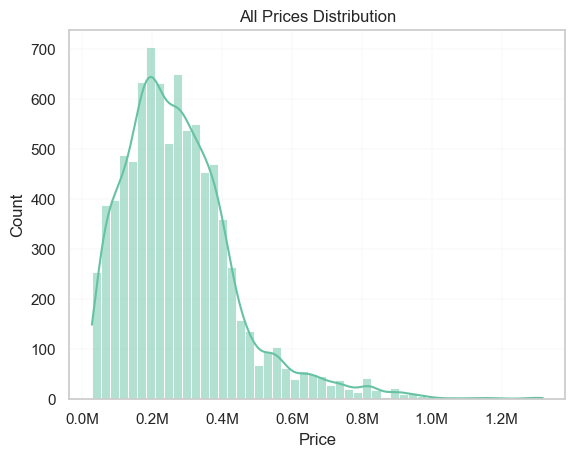

In [ ]:
import matplotlib.ticker as mtick
from matplotlib.ticker import FuncFormatter, StrMethodFormatter

plt.figure()
sns.histplot(data=long_housing_df, x='Price', bins=50, kde=True);
ax = plt.gca()

# Turning off the scientific notation
plt.gca().xaxis.get_major_formatter().set_scientific(False)
plt.gca().xaxis.get_major_formatter().set_useOffset(False)

# 2) Choose one formatter:
#    a) no decimals:
# ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.0f'))
#    b) comma thousands, two decimals:
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}'))
#    c) show in millions:
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: f'{x*1e-6:.1f}M'))

plt.title("All Prices Distribution")
plt.ylabel('Count')


In [ ]:
long_housing_df

,RegionID,RegionName,City,CountyName,SizeRank,Date,Price
0,71023,30303,Atlanta,Fulton County,11821,01/00,122748.0415
1,71025,30305,Atlanta,Fulton County,4619,01/00,326787.3113
2,71026,30306,Atlanta,Fulton County,4556,01/00,292719.9773
3,71027,30307,Atlanta,Dekalb County,5695,01/00,250209.3589
4,71028,30308,Atlanta,Fulton County,5628,01/00,182118.4910
...,...,...,...,...,...,...,...
9070,71063,30345,Atlanta,Dekalb County,4812,11/22,570244.8200
9071,71064,30346,Dunwoody,Dekalb County,13560,11/22,469029.7247
9072,71070,30354,Atlanta,Fulton County,7623,11/22,237192.9102
9073,71076,30360,Dunwoody,Dekalb County,7313,11/22,459542.6915


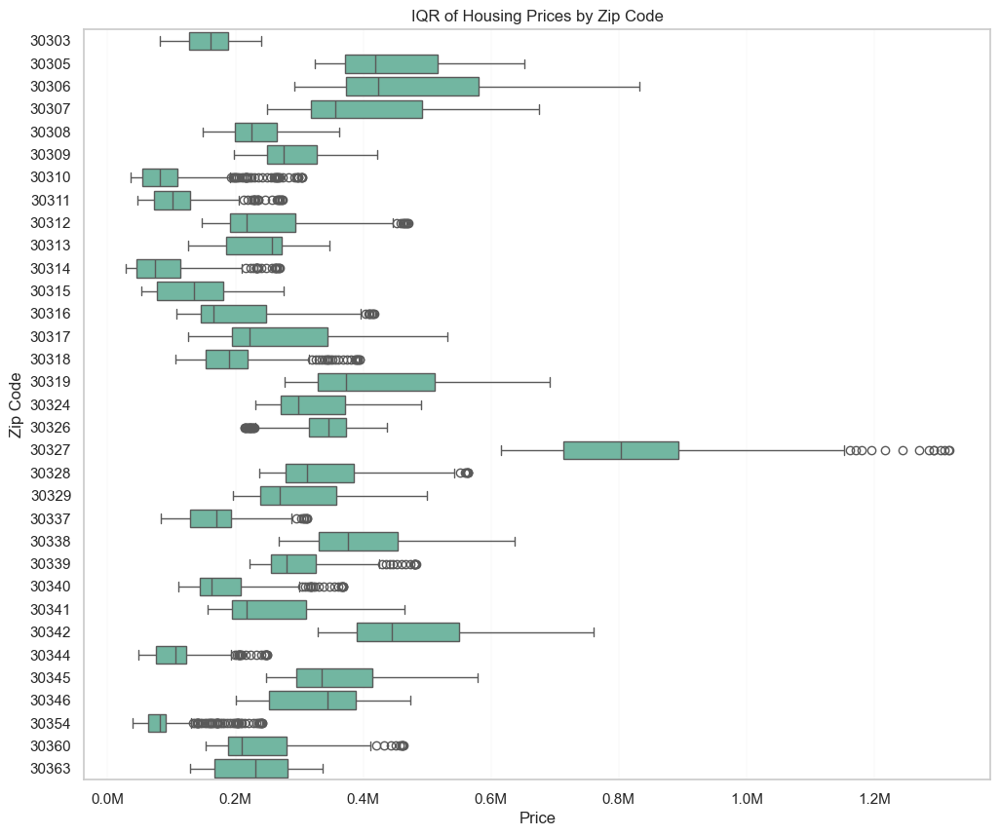

In [ ]:
plt.figure(figsize=(12, 10))
sns.boxplot(
    data=long_housing_df,
    y='RegionName',
    x='Price',
    # showfliers=False
)
plt.title('IQR of Housing Prices by Zip Code')
plt.xlabel('Price')
plt.ylabel('Zip Code')

# plt.tight_layout()                            # add padding so labels don’t get cut off

ax = plt.gca()

# Turning off the scientific notation
plt.gca().xaxis.get_major_formatter().set_scientific(False)
plt.gca().xaxis.get_major_formatter().set_useOffset(False)

# 2) Choose one formatter:
#    a) no decimals:
# ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.0f'))
#    b) comma thousands, two decimals:
# ax.xaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}'))
#    c) show in millions:
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: f'{x*1e-6:.1f}M'))

---

Now let's Move On to Fun Stuff, vizualization

---

In [ ]:
from pathlib import Path
print(Path().absolute())

/Users/omadj/Desktop/This PC/Samsung128/HOMEWORK/I. FUNDAMENTALS OF DS/PROJECT/backup_w_crime_DSCI4780_SPRIN-2025_THE-TECH-TITANS/housing_data


In [13]:
# 1. Read the shapefile (GeoPandas will pull in .shp, .dbf, .shx, .prj automatically)
# zcta_gdf = gpd.read_file("./tl_2022_us_zcta520/tl_2022_us_zcta520.shp")
zcta_gdf = gpd.read_file("../master_datasets/housing_datasets/tl_2022_us_zcta520/tl_2022_us_zcta520.shp")
# zcta_gdf = gpd.read_file("./housing_datasets/tl_2022_us_zcta520/tl_2022_us_zcta520.shp")

print(zcta_gdf.columns)

Index(['ZCTA5CE20', 'GEOID20', 'CLASSFP20', 'MTFCC20', 'FUNCSTAT20', 'ALAND20',
       'AWATER20', 'INTPTLAT20', 'INTPTLON20', 'geometry'],
      dtype='object')


In [ ]:
zcta_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 33791 entries, 0 to 33790
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   ZCTA5CE20   33791 non-null  object  
 1   GEOID20     33791 non-null  object  
 2   CLASSFP20   33791 non-null  object  
 3   MTFCC20     33791 non-null  object  
 4   FUNCSTAT20  33791 non-null  object  
 5   ALAND20     33791 non-null  int64   
 6   AWATER20    33791 non-null  int64   
 7   INTPTLAT20  33791 non-null  object  
 8   INTPTLON20  33791 non-null  object  
 9   geometry    33791 non-null  geometry
dtypes: geometry(1), int64(2), object(7)
memory usage: 2.6+ MB


In [ ]:
zcta_gdf.sample(1)

,ZCTA5CE20,GEOID20,CLASSFP20,MTFCC20,FUNCSTAT20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,geometry
8260,43144,43144,B5,G6350,S,17319974,48829,+39.5298796,-082.1950439,"POLYGON ((-82.22711 39.54687, -82.22691 39.547..."


ZCTA5CE20 -- Holds the zip Value

Now let's Get the county values, to keep the state of georgia

In [ ]:
zcta_gdf.columns

Index(['ZCTA5CE20', 'GEOID20', 'CLASSFP20', 'MTFCC20', 'FUNCSTAT20', 'ALAND20',
       'AWATER20', 'INTPTLAT20', 'INTPTLON20', 'geometry'],
      dtype='object')

In [14]:
counties = gpd.read_file('../master_datasets/housing_datasets/tl_2022_us_county/tl_2022_us_county.shp')

counties.columns

Index(['STATEFP', 'COUNTYFP', 'COUNTYNS', 'GEOID', 'NAME', 'NAMELSAD', 'LSAD',
       'CLASSFP', 'MTFCC', 'CSAFP', 'CBSAFP', 'METDIVFP', 'FUNCSTAT', 'ALAND',
       'AWATER', 'INTPTLAT', 'INTPTLON', 'geometry'],
      dtype='object')

In [ ]:
counties.head(1)

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,31,039,00835841,31039,Cuming,Cuming County,06,H1,G4020,None,None,None,A,1477644346,10691216,+41.9158651,-096.7885168,"POLYGON ((-96.55516 41.91587, -96.55515 41.914..."


Filtering our for GA counties

In [ ]:
ga_counties = counties[counties['STATEFP'] == '13']

ga_counties.sample(1)

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
1811,13,179,00357095,13179,Liberty,Liberty County,06,H1,G4020,None,None,None,A,1337632044,222884791,+31.8074582,-081.4578709,"POLYGON ((-81.61112 31.75186, -81.61142 31.752..."


Joining ZCTA + County Data To Only Keep Data that belongs to GA

In [ ]:
ga_zcta = gpd.sjoin(
    zcta_gdf, 
    ga_counties[['GEOID','geometry']], 
    how='inner',
    predicate='intersects'
)
ga_zcta.sample(1)

,ZCTA5CE20,GEOID20,CLASSFP20,MTFCC20,FUNCSTAT20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,geometry,index_right,GEOID
3387,30742,30742,B5,G6350,S,18783005,0,+34.9355966,-085.2448417,"POLYGON ((-85.26584 34.94692, -85.26579 34.947...",2299,13295


In [ ]:
# Drop duplicates so each ZCTA appears once
ga_zcta = ga_zcta.drop_duplicates('ZCTA5CE20')

A Variable to Hold all Price and ZIPs


In [ ]:
long_housing_df.sample(1)

,RegionID,RegionName,City,CountyName,SizeRank,Date,Price
2468,71060,30342,Sandy Springs,Fulton County,3202,03/06,443299.3208


In [ ]:
prices_and_zips = pd.DataFrame()
prices_and_zips[['RegionID', 'RegionName', 'City', 'CountyName', 'Price']] = long_housing_df[['RegionID', 'RegionName', 'City', 'CountyName', 'Price']]

prices_and_zips.sample(1)

,RegionID,RegionName,City,CountyName,Price
4697,71035,30315,Atlanta,Fulton County,52953.90634


---
---

Export the list of Sales Including the Zip Codes and Prices

---
---

In [ ]:
prices_and_zips.to_csv('../master_outputs/housing_outputs/house_prices_with_zips.csv', index=False)


---

In [ ]:
price_by_zip = (
    long_housing_df
    .groupby('RegionName')['Price']
    .median()
    .reset_index()
    .rename(columns={
        'RegionName':'ZCTA5CE20',
        'Price':'AvgPrice'
    })
)

price_by_zip.sample(len(price_by_zip))

/var/folders/f3/k494q71x50b02p2h67qp0r880000gn/T/ipykernel_73293/2949965204.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby('RegionName')['Price']


,ZCTA5CE20,AvgPrice
28,30345,334940.77510
4,30308,224717.72500
30,30354,81738.91581
22,30338,375809.76800
2,30306,422830.77620
3,30307,356443.02010
10,30314,74080.30958
21,30337,170904.07030
32,30363,230690.58840
25,30341,217500.63330


In [ ]:
price_by_zip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   ZCTA5CE20  33 non-null     category
 1   AvgPrice   33 non-null     float64 
dtypes: category(1), float64(1)
memory usage: 1.7 KB


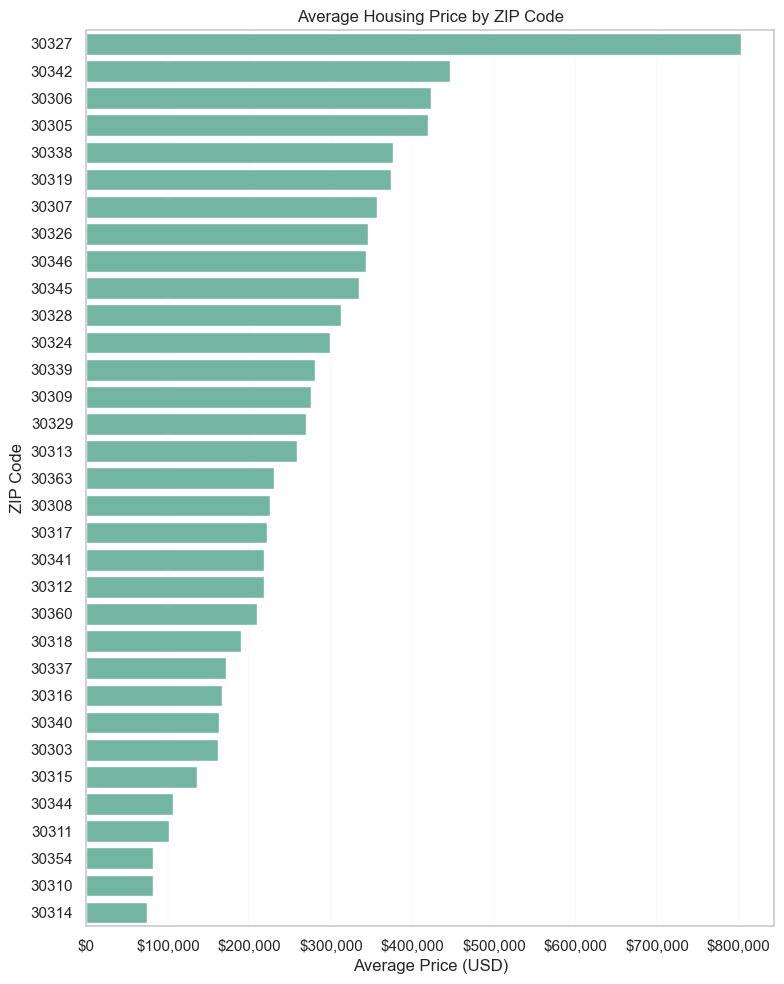

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# assume df has two columns: 'ZCTA5CE20' (zip as string) and 'AvgPrice'
# if your zip codes are numeric, turn them into strings so leading zeros survive:
price_by_zip['ZCTA5CE20'] = price_by_zip['ZCTA5CE20'].astype(str).str.zfill(5)

# sort by price descending
price_by_zip_sorted = price_by_zip.sort_values('AvgPrice', ascending=False)

plt.figure(figsize=(8, 10))
sns.barplot(
    data=price_by_zip_sorted,
    y='ZCTA5CE20',
    x='AvgPrice',
    # palette='',
)
plt.title("Average Housing Price by ZIP Code")
plt.xlabel("Average Price (USD)")
plt.ylabel("ZIP Code")
plt.gca().xaxis.set_major_formatter('${x:,.0f}')  # show dollars, no decimals
plt.tight_layout()
plt.show()

In [ ]:
 # Zero‑pad ZIP codes to 5 digits so they match the shapefile’s codes
price_by_zip['ZCTA5CE20'] = price_by_zip['ZCTA5CE20'].astype(str).str.zfill(5)

price_by_zip.sample(1)

,ZCTA5CE20,AvgPrice
20,30329,269783.1334


In [ ]:
# Merge geometries with price data
zip_merged = ga_zcta.merge(
    price_by_zip, 
    on='ZCTA5CE20',
    how='inner'
)

# 6. Classify into 5 equal‑frequency bins
zip_merged['price_bin'], bins = pd.qcut(
    zip_merged['AvgPrice'],
    q=5,
    retbins=True,
    labels=False
)

# 7. Plot choropleth
colors = ["#ffffb2","#fecc5c","#fd8d3c","#e31a1c","#800026"]
cmap = dict(enumerate(colors))

# fig, ax = plt.subplots(1, 1, figsize=(10, 10))
# zip_merged.plot(
#     column='price_bin',
#     cmap='OrRd',
#     linewidth=0.5,
#     edgecolor='white',
#     legend=False,
#     ax=ax
# )  #  [oai_citation:3‡Mapping and plotting tools - GeoPandas](https://geopandas.org/mapping.html?utm_source=chatgpt.com)

# 8. Build a discrete legend with real dollar ranges
labels = [
    f"${int(bins[i]):,}–${int(bins[i+1]):,}"
    for i in range(len(bins)-1)
]
patches = [
    mpatches.Patch(color=cmap[i], label=labels[i])
    for i in range(len(labels))
]
ax.legend(handles=patches, title="Avg Price Range", loc='upper right')

# 9. Final touches
ax.set_title("Average Housing Price by ZIP (GA)", fontsize=15)
ax.set_axis_off()
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt


# Assume you already have `zip_merged` as in previous steps,
# and it’s in a projected CRS (e.g. EPSG:3857 or a local UTM/State plane).

# 1. Compute a label point for each polygon
#    Option A: centroid (may fall outside very concave polygons)
zip_merged['label_pt'] = zip_merged.geometry.centroid  #  [oai_citation:0‡Having issues while annotating labels on map with different ...](https://stackoverflow.com/questions/68740849/having-issues-while-annotating-labels-on-map-with-different-projections-using-ma?utm_source=chatgpt.com)

#    Option B: representative point (always inside)
# zip_merged['label_pt'] = zip_merged.geometry.representative_point()  #  [oai_citation:1‡Adding labels to districts in GeoPandas - Sho't left to data science](https://shotlefttodatascience.com/2018/05/16/adding-labels-to-districts-in-geopandas/?utm_source=chatgpt.com)

# 2. Extract x, y coordinates
zip_merged['x'] = zip_merged['label_pt'].x
zip_merged['y'] = zip_merged['label_pt'].y

# 3. Plot your choropleth
# fig, ax = plt.subplots(1, 1, figsize=(12, 12), dpi=100)
# fig, ax = plt.subplots(1, 1, figsize=(12, 12), dpi=600)
zip_merged.plot(
    column='AvgPrice',
    cmap='OrRd',
    linewidth=0.2,
    edgecolor='white',
    legend=True,
    ax=ax
)

# 4. Annotate each ZIP with its code and average price
for idx, row in zip_merged.iterrows():
    ax.annotate(
        f"{row.ZCTA5CE20}\n${row.AvgPrice:,.0f}",       # <-- first arg is the text
        (row.x, row.y),                                 # second arg is xy
        ha='center',
        va='center',
        fontsize=6,
        color='black'
    )

# zip_merged.boundary.plot(ax=ax, color='black', linewidth=0.5)
ax.set_title("Average Housing Price by ZIP (GA)")
ax.set_axis_off()
plt.tight_layout()
# plt.show()

/var/folders/f3/k494q71x50b02p2h67qp0r880000gn/T/ipykernel_73293/3538966408.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  zip_merged['label_pt'] = zip_merged.geometry.centroid  #  [oai_citation:0‡Having issues while annotating labels on map with different ...](https://stackoverflow.com/questions/68740849/having-issues-while-annotating-labels-on-map-with-different-projections-using-ma?utm_source=chatgpt.com)


<Figure size 640x480 with 0 Axes>

In [ ]:
# %pip install contextily

In [ ]:
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt

# 1. Reproject to Web Mercator
zip_3857 = zip_merged.to_crs(epsg=3857)

# 2. Compute label points inside each polygon
zip_3857['label_pt'] = zip_3857.geometry.representative_point()  
zip_3857['x'] = zip_3857.label_pt.x
zip_3857['y'] = zip_3857.label_pt.y

# 3. Plot ZIP areas with black outlines at zorder=2
# fig, ax = plt.subplots(figsize=(10, 10), dpi=400)
# fig, ax = plt.subplots(figsize=(10, 10), dpi=600)
zip_3857.plot(
    column='AvgPrice',
    cmap='OrRd',
    linewidth=0.8,
    edgecolor='black',
    legend=True,
    ax=ax,
    zorder=2
)

# 4. Add basemap underneath at zorder=1
cx.add_basemap(
    ax,
    source=cx.providers.OpenStreetMap.Mapnik,
    crs=zip_3857.crs,
    zorder=1
)

# 5. Annotate each ZIP code and its average price at zorder=3
for _, row in zip_3857.iterrows():
    ax.annotate(
        f"{row.ZCTA5CE20}\n${row.AvgPrice:,.0f}",
        (row.x, row.y),
        ha='center',
        va='center',
        fontsize=7,
        color='black',
        zorder=3
    )

ax.set_title("Average Housing Price by ZIP (GA)")
ax.set_axis_off()
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt

# 1. Reproject
zip_3857 = zip_merged.to_crs(epsg=3857)

# 2. Compute your padded bounds
xmin, ymin, xmax, ymax = zip_3857.total_bounds
pad = 5
dx, dy = (xmax - xmin)*pad, (ymax - ymin)*pad
xlim = (xmin - dx, xmax + dx)
ylim = (ymin - dy, ymax + dy)

# 3. Make your figure and immediately set limits
# fig, ax = plt.subplots(figsize=(10,10), dpi=100)
# fig, ax = plt.subplots(figsize=(10,10), dpi=300)
ax.set_xlim(*xlim)
ax.set_ylim(*ylim)

# 4. Now fetch tiles to *fill* that full extent
cx.add_basemap(
    ax,
    source=cx.providers.OpenStreetMap.Mapnik,
    crs=zip_3857.crs,
    zoom=10      # you can tune tile zoom for more/less detail
)

# 5. Plot your ZIP polygons *on top* of the basemap
zip_3857.plot(
    column='AvgPrice', cmap='OrRd',
    edgecolor='black', linewidth=0.8,
    legend=True, ax=ax, zorder=2
)

# 6. Annotate
for _, row in zip_3857.iterrows():
    ax.annotate(
        f"{row.ZCTA5CE20}\n${row.AvgPrice:,.0f}",
        (row.x, row.y), ha='center', va='center',
        fontsize=7, color='black', zorder=3
    )

ax.set_axis_off()
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt

# 1. Reproject to WebMercator
zip_3857 = zip_merged.to_crs(epsg=3857)

# 2. Compute padded bounds for zoom
xmin, ymin, xmax, ymax = zip_3857.total_bounds
# pad = 0.2
pad = 0.8
dx, dy = (xmax - xmin) * pad, (ymax - ymin) * pad
xlim, ylim = (xmin-dx, xmax+dx), (ymin-dy, ymax+dy)

# 3. Make figure & set extent *before* fetching any tiles
# fig, ax = plt.subplots(figsize=(10,16), dpi=100)
# fig, ax = plt.subplots(figsize=(10,16), dpi=600)
ax.set_xlim(*xlim)
ax.set_ylim(*ylim)

# 4. Add a “no labels” basemap
cx.add_basemap(
    ax,
    # source=cx.providers.CartoDB.PositronNoLabels,  # basemap without text
    crs=zip_3857.crs,
    zoom=10
)

# 5. Draw your choropleth on top


# 6. Add just the labels layer on top
cx.add_basemap(
    ax,
    # source=cx.providers.CartoDB.PositronOnlyLabels,  # only text labels
    crs=zip_3857.crs,
    zoom=10,
    alpha=0.8,   # optionally fade a bit
    zorder=1
    # zorder=3
)

# 7. Annotate ZIP codes or skip entirely if labels suffice
# (you can leave this out if you don’t want extra annotation)
for _, row in zip_3857.iterrows():
    ax.annotate(
        f"{row.ZCTA5CE20}\n${row.AvgPrice:,.0f}",
        (row.x, row.y),
        ha='center', va='center', fontsize=7, color='black', zorder=4
    )

ax.set_title("Average Housing Price by ZIP (GA)")
ax.set_axis_off()
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt

# 1. Reproject to WebMercator
zip_3857 = zip_merged.to_crs(epsg=3857)

# 2. Compute padded bounds for zoom
xmin, ymin, xmax, ymax = zip_3857.total_bounds
# pad = 0.2
pad = 0.8
dx, dy = (xmax - xmin) * pad, (ymax - ymin) * pad
xlim, ylim = (xmin-dx, xmax+dx), (ymin-dy, ymax+dy)

# 3. Make figure & set extent *before* fetching any tiles
# fig, ax = plt.subplots(figsize=(10,16), dpi=100)
# fig, ax = plt.subplots(figsize=(10,16), dpi=300)
ax.set_xlim(*xlim)
ax.set_ylim(*ylim)

# 4. Add a “no labels” basemap
cx.add_basemap(
    ax,
    # source=cx.providers.CartoDB.PositronNoLabels,  # basemap without text
    crs=zip_3857.crs,
    zoom=10
)

# 5. Draw your choropleth on top
zip_3857.plot(
    column='AvgPrice',
    cmap='OrRd',
    edgecolor='black',
    linewidth=0.8,
    legend=False,
    # legend=True,
    zorder=0,
    # zorder=2,
    ax=ax,
)

# 6. Add just the labels layer on top
cx.add_basemap(
    ax,
    # source=cx.providers.CartoDB.PositronOnlyLabels,  # only text labels
    crs=zip_3857.crs,
    zoom=10,
    alpha=0.4,   # optionally fade a bit
    # zorder=1
    zorder=3
)

# 7. Annotate ZIP codes or skip entirely if labels suffice
# (you can leave this out if you don’t want extra annotation)
for _, row in zip_3857.iterrows():
    ax.annotate(
        f"{row.ZCTA5CE20}\n${row.AvgPrice:,.0f}",
        (row.x, row.y),
        ha='center', va='center', fontsize=7, color='black', zorder=4
    )

ax.set_title("Average Housing Price by ZIP (GA)")
ax.set_axis_off()
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

In [ ]:
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt

# 1. Reproject to WebMercator
zip_3857 = zip_merged.to_crs(epsg=3857)

# 2. Compute padded bounds for zoom
xmin, ymin, xmax, ymax = zip_3857.total_bounds
# pad = 0.2
pad = 0.1
dx, dy = (xmax - xmin) * pad, (ymax - ymin) * pad
xlim, ylim = (xmin-dx, xmax+dx), (ymin-dy, ymax+dy)

# 3. Make figure & set extent *before* fetching any tiles
# fig, ax = plt.subplots(figsize=(10,16), dpi=600)
ax.set_xlim(*xlim)
ax.set_ylim(*ylim)

# 4. Add a “no labels” basemap
cx.add_basemap(
    ax,
    # source=cx.providers.CartoDB.PositronNoLabels,  # basemap without text
    crs=zip_3857.crs,
    zoom=10
)

# 5. Draw your choropleth on top
zip_3857.plot(
    column='AvgPrice',
    cmap='OrRd',
    edgecolor='black',
    linewidth=0.8,
    legend=False,
    # legend=True,
    zorder=0,
    # zorder=2,
    ax=ax,
)

# 6. Add just the labels layer on top
cx.add_basemap(
    ax,
    # source=cx.providers.CartoDB.PositronOnlyLabels,  # only text labels
    crs=zip_3857.crs,
    zoom=10,
    alpha=0.2,   # optionally fade a bit
    # zorder=1
    zorder=3
)

# 7. Annotate ZIP codes or skip entirely if labels suffice
# (you can leave this out if you don’t want extra annotation)
for _, row in zip_3857.iterrows():
    ax.annotate(
        f"{row.ZCTA5CE20}\n${row.AvgPrice:,.0f}",
        (row.x, row.y),
        ha='center', va='center', fontsize=7, color='black', zorder=4
    )

ax.set_title("Average Housing Price by ZIP (GA)")
ax.set_axis_off()
plt.tight_layout()
plt.show()
ax.clear()

<Figure size 640x480 with 0 Axes>

In [ ]:
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib as mpl
import pandas as pd

# 1. Prepare your data (assume zip_merged exists with AvgPrice)
zip_3857 = zip_merged.to_crs(epsg=3857)

# 2. Compute your quantile bins
zip_3857['price_bin'], bins = pd.qcut(
    zip_3857['AvgPrice'], q=5, retbins=True, labels=False
)

# 3. Compute padded bounds and set up figure
xmin, ymin, xmax, ymax = zip_3857.total_bounds
pad = 0.1
dx, dy = (xmax - xmin) * pad, (ymax - ymin) * pad
xlim, ylim = (xmin-dx, xmax+dx), (ymin-dy, ymax+dy)

# fig, ax = plt.subplots(figsize=(10, 16), dpi=300)
ax.set_xlim(*xlim)
ax.set_ylim(*ylim)

# 4. Add a single “no‑labels” basemap, faded to 60%
cx.add_basemap(
    ax,
    # source=cx.providers.CartoDB.PositronNoLabels,  # no text labels
    crs=zip_3857.crs,
    zoom=10,
    alpha=1,    # Map View opacity
    zorder=1
)

# 5. Draw your choropleth on top at full opacity
pc = zip_3857.plot(
    column='AvgPrice',
    cmap='OrRd',
    edgecolor='black',
    linewidth=0.8,
    alpha=0.9,     # Choropleth Strength
    legend=False,  # we’ll add a manual legend below
    ax=ax,
    zorder=2
)

# 6. Continuous colorbar
vmin, vmax = zip_3857['AvgPrice'].min(), zip_3857['AvgPrice'].max()
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
sm = mpl.cm.ScalarMappable(norm=norm, cmap='OrRd')
sm.set_array([])
cbar = fig.colorbar(
    sm, ax=ax,
    fraction=0.04,
    pad=0.02
)
cbar.set_label("Average Price (USD)")

# 7. Discrete legend for quantile bins
colors = ["#ffffb2","#fecc5c","#fd8d3c","#e31a1c","#800026"]
labels = [
    f"${int(bins[i]):,}–${int(bins[i+1]):,}"
    for i in range(len(bins)-1)
]
patches = [mpatches.Patch(color=colors[i], label=labels[i])
           for i in range(len(labels))]

leg2 = ax.legend(
    handles=patches,
    title="Price Ranges",
    loc="upper right",
    frameon=True,
    facecolor="#f0f0f0",
    edgecolor="black",
    framealpha=1.0,
    prop={'size': 10},
    title_fontsize='12'
)
ax.add_artist(leg2)

# 8. (Optional) Annotate each ZIP code if desired
for _, row in zip_3857.iterrows():
    ax.annotate(
        f"{row.ZCTA5CE20}\n${row.AvgPrice:,.0f}",
        (row.x, row.y),
        ha='center', va='center',
        fontsize=7, color='black',
        zorder=3
    )

# 9. Final touches
ax.set_title("Average Housing Price by ZIP (GA)", fontsize=16)
ax.set_axis_off()
plt.tight_layout()
# plt.show()

<Figure size 640x480 with 0 Axes>

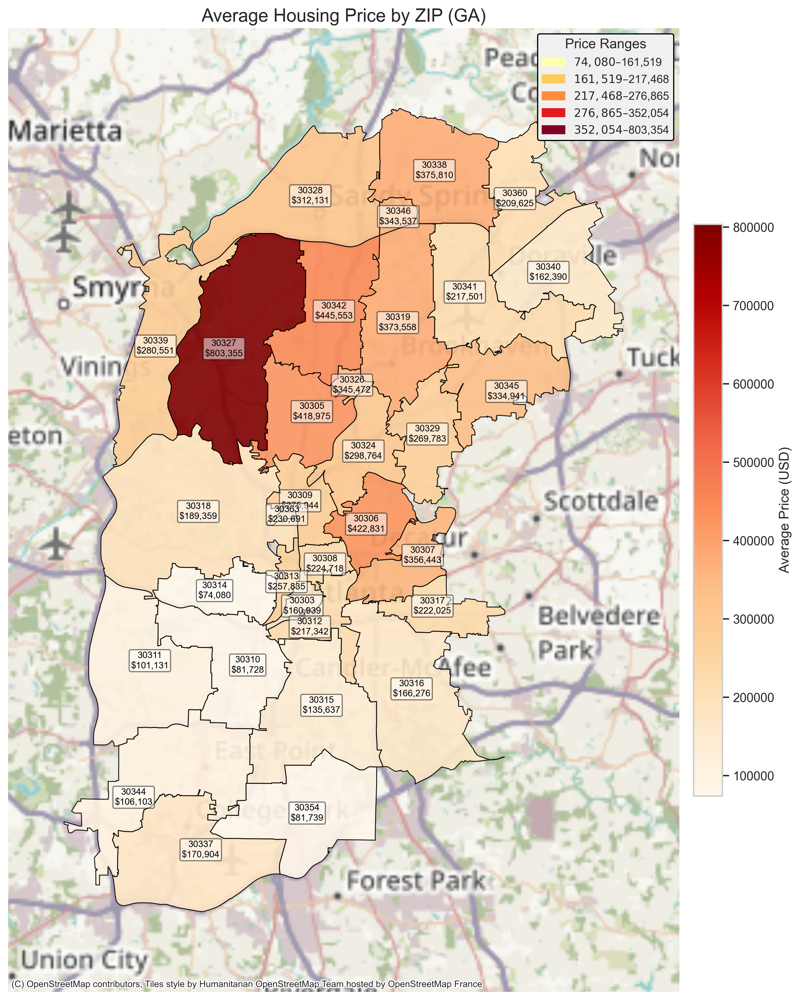

In [ ]:
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib as mpl
import pandas as pd

# 1. Prepare your data (assume zip_merged exists with AvgPrice)
zip_3857 = zip_merged.to_crs(epsg=3857)

# — Compute label points for annotation
zip_3857['label_pt'] = zip_3857.geometry.representative_point()
zip_3857['x'] = zip_3857.label_pt.x
zip_3857['y'] = zip_3857.label_pt.y

# 2. Compute your quantile bins
zip_3857['price_bin'], bins = pd.qcut(
    zip_3857['AvgPrice'], q=5, retbins=True, labels=False
)

# 3. Compute padded bounds and set up figure
xmin, ymin, xmax, ymax = zip_3857.total_bounds
pad = 0.1
dx, dy = (xmax - xmin) * pad, (ymax - ymin) * pad
xlim, ylim = (xmin-dx, xmax+dx), (ymin-dy, ymax+dy)

fig, ax = plt.subplots(figsize=(10, 16), dpi=300)
ax.set_xlim(*xlim)
ax.set_ylim(*ylim)

# 4. Add a single “no‑labels” basemap, faded to 60%
cx.add_basemap(
    ax,
    # source=cx.providers.CartoDB.PositronNoLabels,  # no text labels
    crs=zip_3857.crs,
    zoom=10,
    alpha=1,    # Map View opacity
    zorder=1
)

# 5. Draw your choropleth on top at full opacity
pc = zip_3857.plot(
    column='AvgPrice',
    cmap='OrRd',
    edgecolor='black',
    linewidth=0.8,
    alpha=0.9,     # Choropleth Strength
    legend=False,  # we’ll add a manual legend below
    ax=ax,
    zorder=2
)

# 6. Continuous colorbar
vmin, vmax = zip_3857['AvgPrice'].min(), zip_3857['AvgPrice'].max()
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
sm = mpl.cm.ScalarMappable(norm=norm, cmap='OrRd')
sm.set_array([])
cbar = fig.colorbar(
    sm, ax=ax,
    fraction=0.04,
    pad=0.02
)
cbar.set_label("Average Price (USD)")

# 7. Discrete legend for quantile bins
colors = ["#ffffb2","#fecc5c","#fd8d3c","#e31a1c","#800026"]
labels = [
    f"${int(bins[i]):,}–${int(bins[i+1]):,}"
    for i in range(len(bins)-1)
]
patches = [mpatches.Patch(color=colors[i], label=labels[i])
           for i in range(len(labels))]

leg2 = ax.legend(
    handles=patches,
    title="Price Ranges",
    loc="upper right",
    frameon=True,
    facecolor="#f0f0f0",
    edgecolor="black",
    framealpha=1.0,
    prop={'size': 10},
    title_fontsize='12'
)
ax.add_artist(leg2)

# 8. (Optional) Annotate each ZIP code if desired
for _, row in zip_3857.iterrows():
    ax.annotate(
        f"{row.ZCTA5CE20}\n${row.AvgPrice:,.0f}",
        (row.x, row.y),
        ha='center', va='center',
        fontsize=8, color='black',
        zorder=3,
        bbox=dict(
            boxstyle='round,pad=0.2',
            fc='white',    # fill color
            ec='black',    # edge color
            alpha=0.5      # transparency
    ))

# 9. Final touches
ax.set_title("Average Housing Price by ZIP (GA)", fontsize=16)
ax.set_axis_off()
plt.tight_layout()
plt.show()

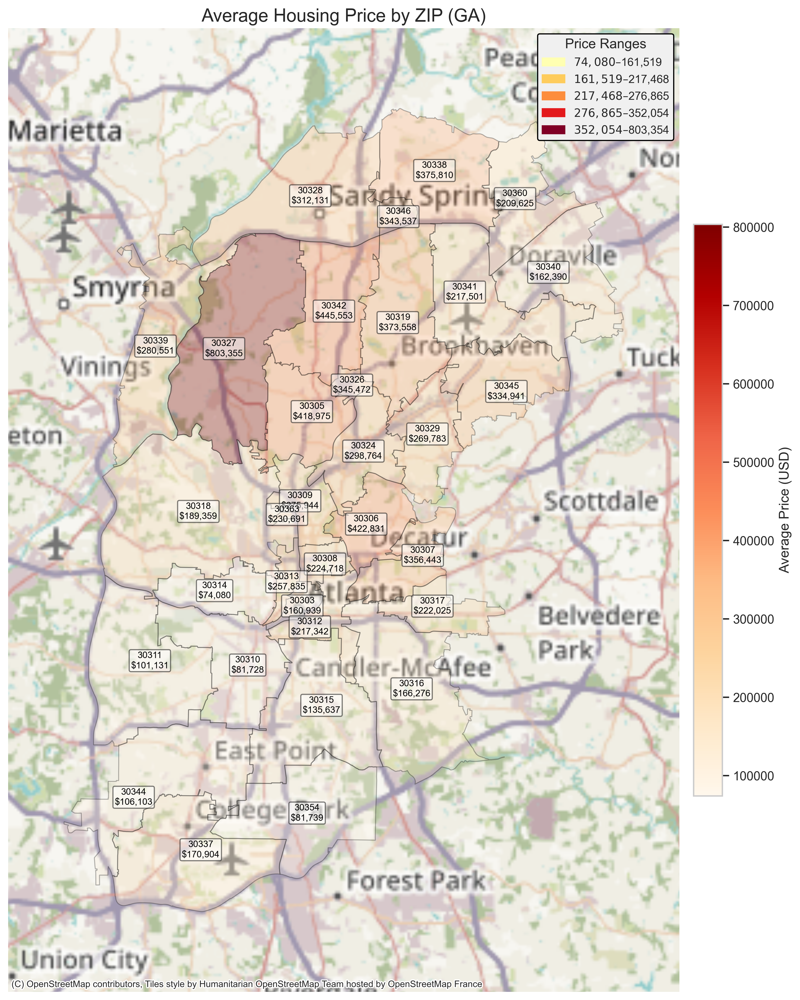

In [ ]:
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib as mpl
import pandas as pd

# 1. Prepare your data (assume zip_merged exists with AvgPrice)
zip_3857 = zip_merged.to_crs(epsg=3857)

# — Compute label points for annotation
zip_3857['label_pt'] = zip_3857.geometry.representative_point()
zip_3857['x'] = zip_3857.label_pt.x
zip_3857['y'] = zip_3857.label_pt.y

# 2. Compute your quantile bins
zip_3857['price_bin'], bins = pd.qcut(
    zip_3857['AvgPrice'], q=5, retbins=True, labels=False
)

# 3. Compute padded bounds and set up figure
xmin, ymin, xmax, ymax = zip_3857.total_bounds
pad = 0.1
dx, dy = (xmax - xmin) * pad, (ymax - ymin) * pad
xlim, ylim = (xmin-dx, xmax+dx), (ymin-dy, ymax+dy)

fig, ax = plt.subplots(figsize=(10, 16), dpi=300)
ax.set_xlim(*xlim)
ax.set_ylim(*ylim)

# 4. Add a single “no‑labels” basemap, faded to 60%
cx.add_basemap(
    ax,
    # source=cx.providers.CartoDB.PositronNoLabels,  # no text labels
    crs=zip_3857.crs,
    zoom=10,
    alpha=1,    # Map View opacity
    zorder=1
)

# 5. Draw your choropleth on top at full opacity
pc = zip_3857.plot(
    column='AvgPrice',
    cmap='OrRd',
    edgecolor='black',
    linewidth=0.8,
    alpha=0.3,     # Choropleth Strength
    legend=False,  # we’ll add a manual legend below
    ax=ax,
    zorder=2
)

# 6. Continuous colorbar
vmin, vmax = zip_3857['AvgPrice'].min(), zip_3857['AvgPrice'].max()
norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
sm = mpl.cm.ScalarMappable(norm=norm, cmap='OrRd')
sm.set_array([])
cbar = fig.colorbar(
    sm, ax=ax,
    fraction=0.04,
    pad=0.02
)
cbar.set_label("Average Price (USD)")

# 7. Discrete legend for quantile bins
colors = ["#ffffb2","#fecc5c","#fd8d3c","#e31a1c","#800026"]
labels = [
    f"${int(bins[i]):,}–${int(bins[i+1]):,}"
    for i in range(len(bins)-1)
]
patches = [mpatches.Patch(color=colors[i], label=labels[i])
           for i in range(len(labels))]

leg2 = ax.legend(
    handles=patches,
    title="Price Ranges",
    loc="upper right",
    frameon=True,
    facecolor="#f0f0f0",
    edgecolor="black",
    framealpha=1.0,
    prop={'size': 10},
    title_fontsize='12'
)
ax.add_artist(leg2)

# 8. (Optional) Annotate each ZIP code if desired
for _, row in zip_3857.iterrows():
    ax.annotate(
        f"{row.ZCTA5CE20}\n${row.AvgPrice:,.0f}",
        (row.x, row.y),
        ha='center', va='center',
        fontsize=8, color='black',
        zorder=3,
        bbox=dict(
            boxstyle='round,pad=0.2',
            fc='white',    # fill color
            ec='black',    # edge color
            alpha=0.5      # transparency
    ))

# 9. Final touches
ax.set_title("Average Housing Price by ZIP (GA)", fontsize=16)
ax.set_axis_off()
plt.tight_layout()
plt.show()

In [ ]:
zip_merged.sample()

,ZCTA5CE20,GEOID20,CLASSFP20,MTFCC20,FUNCSTAT20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,geometry,index_right,GEOID,AvgPrice,price_bin,label_pt,x,y
31,30315,30315,B5,G6350,S,29705202,42102,+33.7027410,-084.3828526,"POLYGON ((-84.41823 33.67691, -84.41723 33.677...",176,13089,135636.6092,0,POINT (-84.38273 33.70312),-84.382727,33.703119


In [ ]:
zip_merged.sort_values(by='GEOID20', ascending=True).sample(1)

,ZCTA5CE20,GEOID20,CLASSFP20,MTFCC20,FUNCSTAT20,ALAND20,AWATER20,INTPTLAT20,INTPTLON20,geometry,index_right,GEOID,AvgPrice,price_bin,label_pt,x,y
6,30360,30360,B5,G6350,S,15831191,372227,+33.9338853,-084.2720336,"POLYGON ((-84.29335 33.93647, -84.29328 33.937...",176,13089,209625.3761,1,POINT (-84.27304 33.93196),-84.273042,33.931963


---

Exporting House Prices groupped by Zipcode:

---

In [ ]:
zip_merged.sort_values(by='GEOID20', ascending=True).to_csv('../master_outputs/housing_outputs/avg_house_prices_by_zips.csv')

---

---

In [ ]:
# import cartopy.crs as ccrs

# ax = plt.axes(projection=ccrs.RotatedPole(pole_longitude=0, pole_latitude=37))
# zip_rot.to_crs(ccrs.PlateCarree().proj4_init).plot(
#     ax=ax, transform=ccrs.PlateCarree(), ...
# )
# ax.set_extent([xmin, xmax, ymin, ymax], crs=ccrs.CRS(zip_rot.crs))
# ax.stock_img()

In [ ]:
# %pip install folium
# %pip install mapclassify
# %pip install matplotlib
# %pip install geopy


In [ ]:
import ssl, certifi
import geopy.geocoders
from geopy.geocoders import Nominatim

# Build an SSL context that uses certifi’s root CAs
ctx = ssl.create_default_context(cafile=certifi.where())
# Instruct geopy to use that context for all requests
geopy.geocoders.options.default_ssl_context = ctx

# Now geocoding will work without SSL errors
geolocator = Nominatim(user_agent="house_prices", timeout=10)
loc = geolocator.geocode("Atlanta, GA")
print(loc.latitude, loc.longitude)

33.7489924 -84.3902644


In [ ]:
# plt.Figure(figsize=(5,5))
# # 4. Reproject to EPSG:4326 for interactive mapping
# zip_4326 = zip_merged.to_crs(epsg=4326) # geographic lat/lon  [oai_citation:0‡geopandas.GeoDataFrame.explore](https://geopandas.org/docs/reference/api/geopandas.GeoDataFrame.explore.html?utm_source=chatgpt.com)

# #  5. Call .explore() for an interactive map
# m = zip_4326.explore(
#     column='AvgPrice',                 # color by average price
#     cmap='OrRd',
#     tooltip=['ZCTA5CE20','AvgPrice'],  # show ZIP and price on hover
#     tiles='CartoDB positron',          # light basemap
#     location=[loc.latitude, loc.longitude],           # center on GA
#     zoom_start=11,                       # state‐level zoom
#     legend=True,
#     # color='red'
#     # width='60%',          # map width in pixels
#     # height='60%'          # map height in pixels
# )
# # m.fit_bounds(zip_4326.total_bounds.reshape(5,5).tolist())
# m                                    # renders the interactive map in Jupyter  [oai_citation:1‡Interactive maps](https://autogis-site.readthedocs.io/en/lih/lessons/lesson-5/interactive-maps.html?utm_source=chatgpt.com)

In [ ]:
# import io
# from PIL import Image

# # 1. Render the map to a PNG in memory (5 = scale factor)
# img_data = m._to_png(5)

# # 2. Load it into PIL and save
# img = Image.open(io.BytesIO(img_data))
# img.save("ga_zip_price_map.png")